In [2]:
from skimage import io, color, exposure, filters, transform
from skimage.morphology import binary_erosion, binary_dilation
from scipy import ndimage

from skimage.segmentation import watershed
from skimage.feature import peak_local_max
from skimage.measure import regionprops, label
from skimage.filters import sobel 

from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt
import numpy as np

from scipy import ndimage as ndi

def show_image(img, grayscale=False):
    if grayscale:
        plt.imshow(img, cmap=plt.cm.gray)
    else:
        plt.imshow(img)
    plt.show()

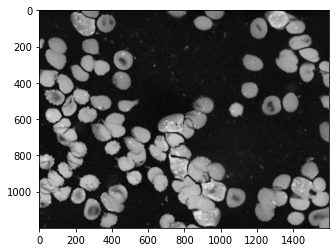

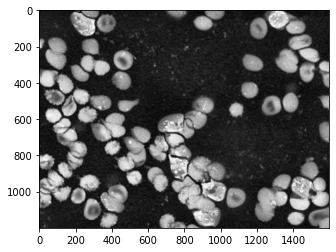

sobel


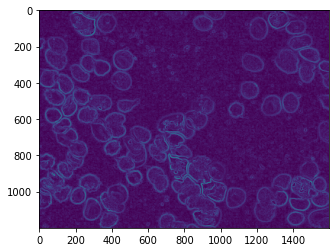

inv


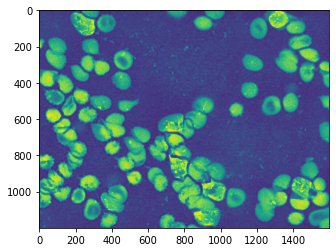

grayscale


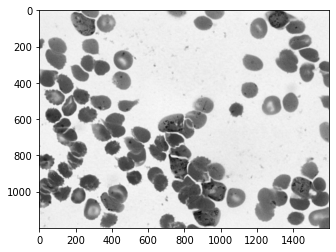

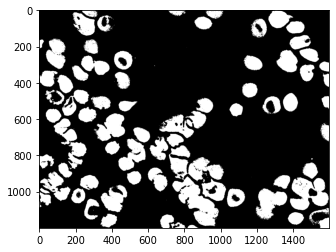

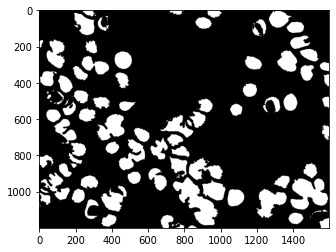

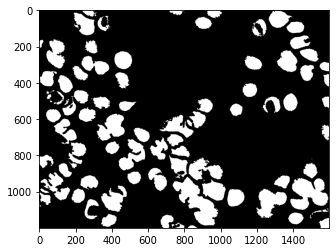

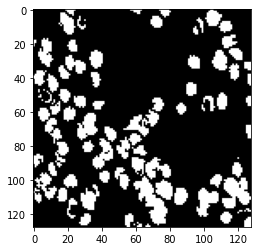

TypeError: Image data of dtype object cannot be converted to float

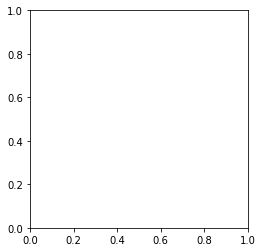

In [3]:
img = io.imread('images/0dcbf2c9-f959-4703-a72b-f6a81e66c2ea.png')
img_orig = io.imread('images/0dcbf2c9-f959-4703-a72b-f6a81e66c2ea.png')
#turning image to gray and inverting it
grayscale = color.rgb2gray(img)

inverted = 1 - grayscale

show_image(inverted, True)

inverted = exposure.equalize_adapthist(inverted)
show_image(inverted, True)

print("sobel")
show_image(sobel(inverted))
sobeled = sobel(inverted)
inverted = inverted - sobeled
print("inv")
show_image(inverted)
#various image transformation in order to get the best representation
threshold = filters.threshold_mean(inverted)
binarized = inverted > threshold + 0.2

eroded = binary_erosion(binarized)

eroded = binary_erosion(eroded) #applied two times

filled = ndimage.binary_fill_holes(eroded) #this image will later be used 

eroded = binary_erosion(filled)

scaled = transform.resize(filled, (128, 128), anti_aliasing=False)


#showing various images to compare the results of transformations
print('grayscale')
show_image(grayscale, True)
show_image(binarized, True)
show_image(eroded, True)
show_image(filled, True)
show_image(scaled, True)


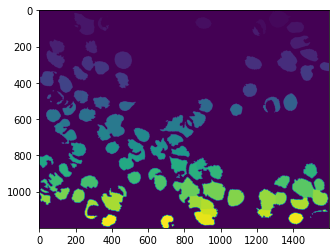

In [4]:
#doing distance transformation and watershed algorithm in order to distinguish diff eryts
distance = ndi.distance_transform_edt(eroded)
local_maxi = peak_local_max(distance, indices=False, footprint=np.ones((33, 33)),
                            labels=eroded)

markers = ndi.label(local_maxi)[0]

labels = watershed(-distance, markers, mask=eroded)
show_image(labels)


In [5]:
#counting the num of diff regions that are found
regions = regionprops(labels)
regions = [r for r in regions if r.area > 50]

print('Number of erythrocytes:', len(regions) - 1)


Number of erythrocytes: 119


In [6]:
#print(labels[1000,1247])
import numpy as np 
np.max(labels)


129

In [7]:
#extracting pixels by color
colored = {}
for i in range(labels.shape[0]):
    for j in range(labels.shape[1]):
        if labels[i,j] != 0:
            if labels[i,j] not in colored:
                colored[labels[i,j]] = []
            colored[labels[i,j]].append({"x": i, "y":j})
print("done")
#for k,v in colored.items():
#    print(k,v)
                

done


In [8]:
#key is color, v are pixel values
from skimage.util import crop

images = []
for k,v in colored.items():
    max_x = 0
    max_y = 0
    min_x = 5000
    min_y = 5000
    for val in v:
        if val["x"] > max_x:
            max_x = val["x"]
        if val['x'] < min_x:
            min_x = val["x"]
        if val["y"] > max_y:
            max_y = val["y"]
        if val["y"] < min_y:
            min_y = val["y"]
    #print(min_x, max_x, min_y, max_y)
    cropped = 1 - grayscale[ min_x:max_x,min_y:max_y,] #crop(img, ((min_x, max_x), (min_y, max_y), (0,0)), copy=False)
    images.append(cropped)


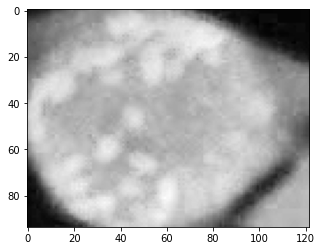

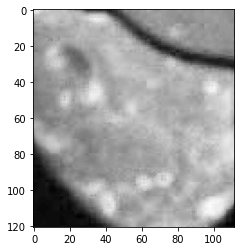

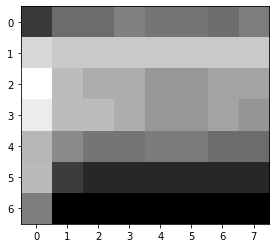

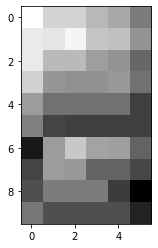

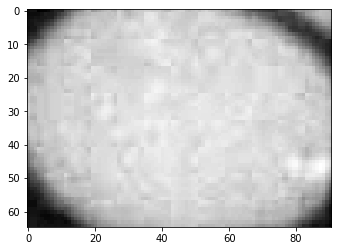

...

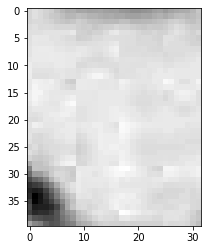

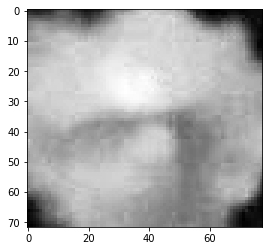

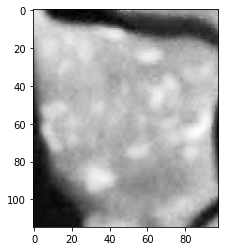

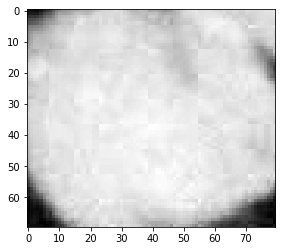

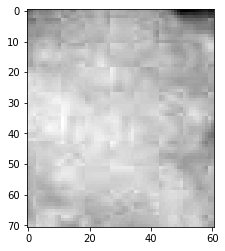

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:18: UserWarning: Attempting to set identical left == right == -0.5 results in singular transformations; automatically expanding.
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:18: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.


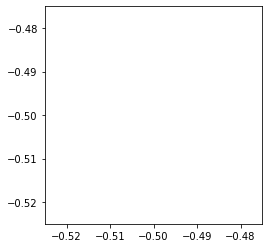

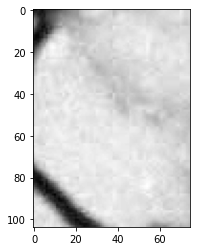

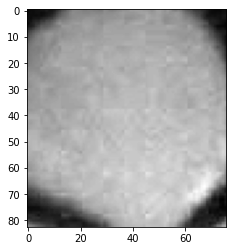

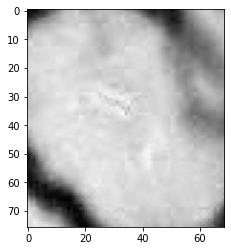

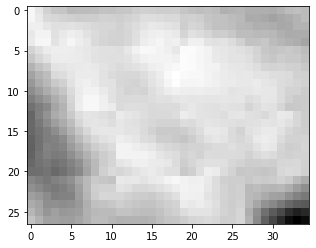

...

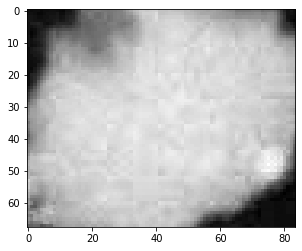

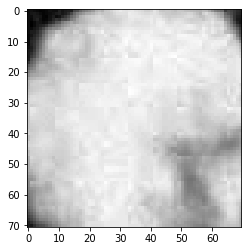

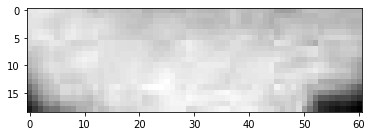

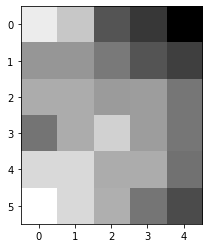

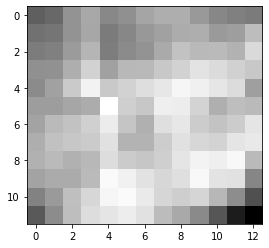

In [9]:
for image in images:
    show_image(image, True)

In [10]:
len(images)

129

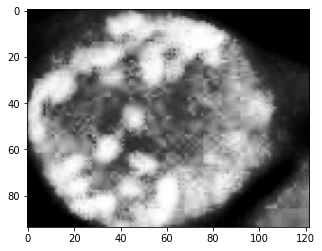

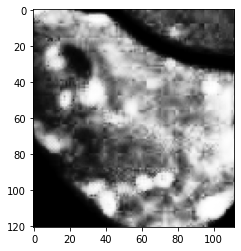

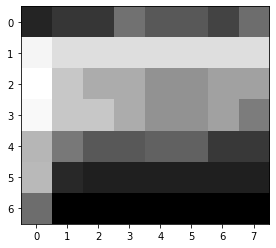

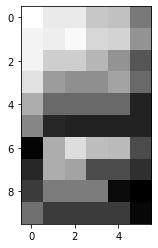

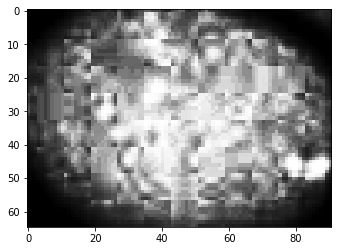

...

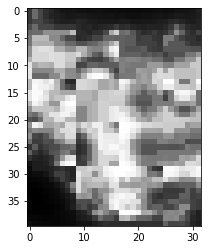

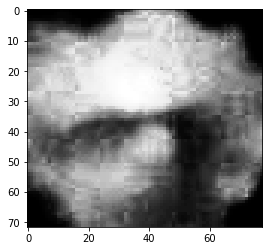

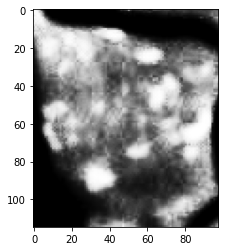

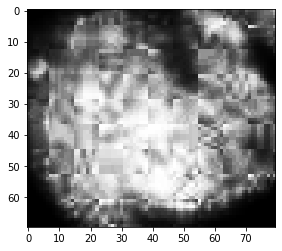

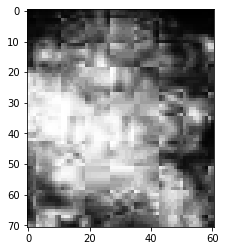

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/skimage/exposure/exposure.py:183: RuntimeWarning: invalid value encountered in true_divide
  img_cdf = img_cdf / float(img_cdf[-1])
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:18: UserWarning: Attempting to set identical left == right == -0.5 results in singular transformations; automatically expanding.
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:18: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.


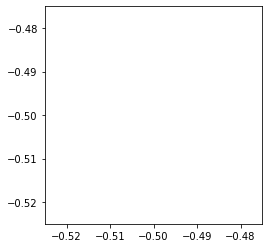

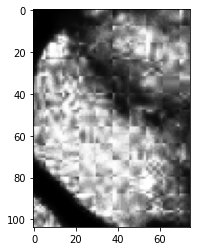

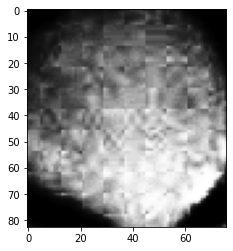

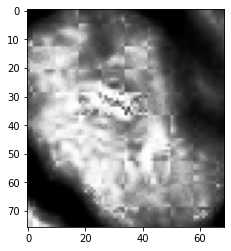

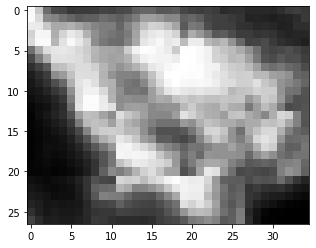

...

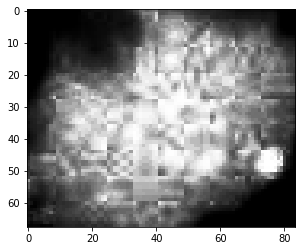

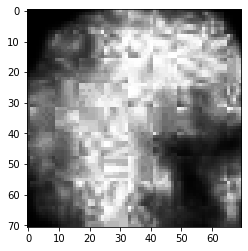

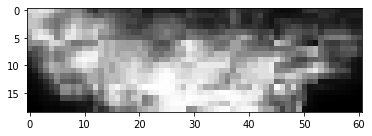

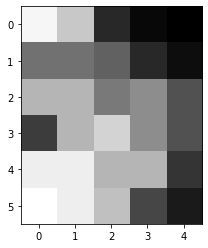

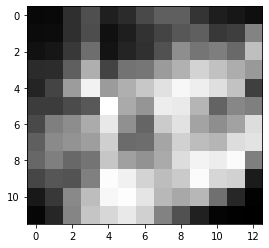

In [11]:
import matplotlib
import matplotlib.pyplot as plt

for img in images:
    # Logarithmic
    #logarithmic_corrected = exposure.adjust_log(img, 1)
    # Gamma
    gamma_corrected = exposure.adjust_gamma(img, 5)

    img_eq = exposure.equalize_hist(gamma_corrected)
    show_image(img_eq, True)

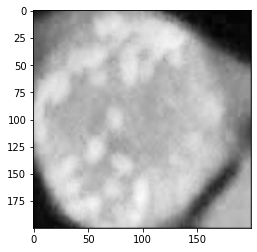

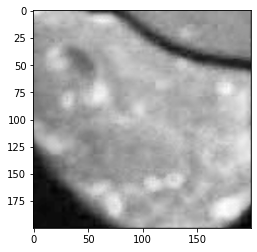

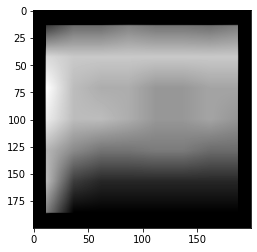

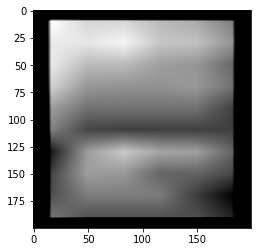

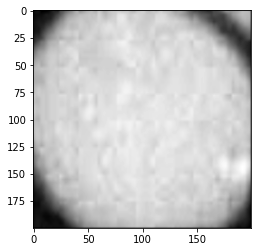

...

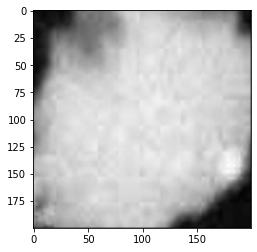

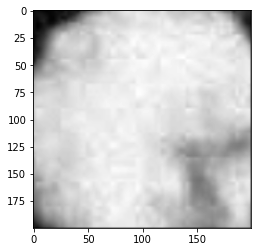

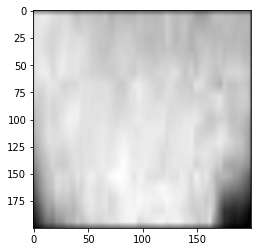

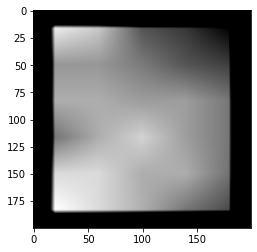

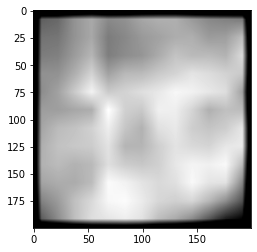

In [12]:
from skimage.transform import resize
for img in images:
    if img.shape != (0,0):
        img = resize(img, (200, 200),mode='constant', preserve_range=True)
        show_image(img, True)


Slic number of segments: 121


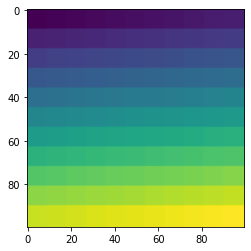

In [13]:
from skimage.segmentation import slic, quickshift, join_segmentations
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float
from skimage.color import gray2rgb

img = img_as_float(img[::2, ::2])
segments_slic = slic(img,  n_segments=117, max_iter=160, sigma=1, compactness=0.75,
            multichannel=False, start_label=0)

print("Slic number of segments: %d" % len(np.unique(segments_slic)))
show_image(segments_slic)

skimage.filters.thresholding.threshold_isodata
skimage.filters.thresholding.threshold_li
skimage.filters.thresholding.threshold_mean
skimage.filters.thresholding.threshold_minimum
skimage.filters.thresholding.threshold_otsu
skimage.filters.thresholding.threshold_triangle
skimage.filters.thresholding.threshold_yen


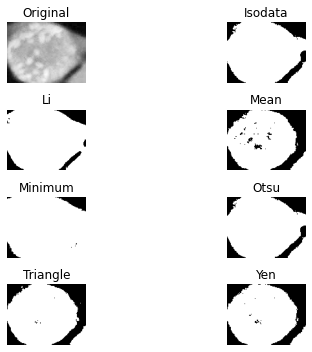

In [14]:
result = filters.thresholding.try_all_threshold(images[0])

In [15]:

seg_join = join_segmentations(segments_slic, labels)
show_image(seg_join)

ValueError: Cannot join segmentations of different shape. s1.shape: (100, 100), s2.shape: (1200, 1600)

In [16]:
def img_to_array(img, toNum = False):
    if not toNum:
        return np.array([img[i,j] for i in range(img.shape[0]) for j in range(img.shape[1])])
    tmp = np.array([img[i,j] for i in range(img.shape[0]) for j in range(img.shape[1])])
    return [1 if x == True else 0 for x in tmp]

In [17]:
from skimage.color import rgb2hsv

def pixel_features(pixel):
    #HSV
    hsv_pix = rgb2hsv(pixel) #np.matrix([[pixel]])
    hue_pix = hsv_pix[0]
    sat_pix = hsv_pix[1]
    value_pix = hsv_pix[2] #luminosity
    return {
        'hue': hue_pix,
        'saturation': sat_pix,
        'value': value_pix,
    }


In [18]:
def image_to_features(image, pic_width, pic_height):
    print(pic_width, pic_height)
    image_array = img_to_array(image);
    all_features = []
    for i in range(image_array.shape[0]):
        pixel = pixel_features(image_array[i])
        features = {
            'hue': pixel['hue'],
            'saturation': pixel['saturation'],
            'value': pixel['value']
        }
        if i % pic_width != 0:
            #not on left edge
            pixel = pixel_features(image_array[i - 1])
            features.update({
                '-1:hue': pixel['hue'],
                '-1:saturation':  pixel['saturation'],
                '-1:value': pixel['value']
            })
            
        if i % pic_width != pic_width-1:
            #not right edge
            pixel = pixel_features(image_array[i + 1])
            features.update({
                '+1:hue': pixel['hue'],
                '+1:saturation':  pixel['saturation'],
                '+1:value': pixel['value']
            })
        if i >= pic_width:
            #not upper edge
            pixel = pixel_features(image_array[i - pic_width])
            features.update({
                f'-{pic_width}:hue': pixel['hue'],
                f'-{pic_width}:saturation':  pixel['saturation'],
                f'-{pic_width}:value': pixel['value']
            })
        if i < (pic_height - 1) * pic_width:
            #not bottom edge 
            pixel = pixel_features(image_array[i + pic_width])
            features.update({
                f'+{pic_width}:hue': pixel['hue'],
                f'+{pic_width}:saturation': pixel['saturation'],
                f'+{pic_width}:value': pixel['value']
            })
            
        all_features.append([features])
#         print(i)
    return all_features

In [19]:
featured_image = image_to_features(img_orig, img_orig.shape[0], img_orig.shape[1])

1200 1600


In [20]:
from sklearn.model_selection import train_test_split
print(filled)
filled_to_array = img_to_array(filled, toNum=True)
# print(filled_to_array.shape[0])
# def bin_to_num(img):
#     new_img = np.zeros(img.shape[0], dtype=int)
#     for i in range(img.shape[0]):
#         if img[i] == True:
#             new_img[i] = [1]
#         else:
#             new_img[i] = [0]
#     return new_img
filled_to_num = [[f'{x}'] for x in filled_to_array]
print(filled_to_num)
X_train, X_test, Y_train, Y_test = train_test_split(featured_image, filled_to_num, test_size=0.33, random_state=42)


[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [21]:
import sklearn_crfsuite
crf = sklearn_crfsuite.CRF(
    algorithm='lbfgs',
    c1=0.1, 
    c2=0.1, 
    max_iterations=20,
    all_possible_transitions=False,
)
crf.fit(X_train, Y_train);

In [22]:
labels = list(crf.classes_)
labels

['0', '1']

In [23]:
from sklearn.metrics import make_scorer
#from sklearn.cross_validation import cross_val_score
from sklearn_crfsuite import scorers
from sklearn_crfsuite import metrics
Y_pred = crf.predict(X_test)
metrics.flat_f1_score(Y_test, Y_pred,
                      average='weighted', labels=labels)


0.9397963396633903

In [24]:
sorted_labels = sorted(
    labels,
    key=lambda name: (name[1:], name[0])
)
print(metrics.flat_classification_report(
    Y_test, Y_pred, labels=sorted_labels, digits=3
))

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/utils/validation.py:70: FutureWarning: Pass labels=['0', '1'] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


              precision    recall  f1-score   support

           0      0.968     0.953     0.960    488247
           1      0.849     0.894     0.871    145353

    accuracy                          0.939    633600
   macro avg      0.909     0.923     0.916    633600
weighted avg      0.941     0.939     0.940    633600



In [ ]:
"""
import scipy.stats
from sklearn.model_selection import RandomizedSearchCV
#from sklearn.grid_search import RandomizedSearchCV
crf = sklearn_crfsuite.CRF(
    algorithm='lbfgs',
    max_iterations=100,
    all_possible_transitions=True
)
params_space = {
    'c1': scipy.stats.expon(scale=0.5),
    'c2': scipy.stats.expon(scale=0.05),
}

# use the same metric for evaluation
f1_scorer = make_scorer(metrics.flat_f1_score,
                        average='weighted', labels=labels)

# search
rs = RandomizedSearchCV(crf, params_space,
                        cv=3,
                        verbose=1,
                        n_jobs=-1,
                        n_iter=50,
                        scoring=f1_scorer)
rs.fit(X_train, Y_train)
"""

Fitting 3 folds for each of 50 candidates, totalling 150 fits


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/base.py:213: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/joblib/externals/loky/process_executor.py:691: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


In [ ]:
"""
print('best params:', rs.best_params_)
print('best CV score:', rs.best_score_)
print('model size: {:0.2f}M'.format(rs.best_estimator_.size_ / 1000000))
"""